In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.inspection import permutation_importance
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Nuestras clases
from cod.LecturaDeDatos import *
from cod.Modelos import *

In [3]:
lectura_datos = LecturaDeDatos("https://raw.githubusercontent.com/Jtrejos2901/proyecto_herramientas_ii/main/data/diabetes.csv")

# Descargar los datos
lectura_datos.descargar_datos()

Datos descargados exitosamente.


In [4]:
# Describir los datos
lectura_datos.describir_datos()

Descripción de los datos:
       Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin    BMI  \
count        768.0    768.0          768.0          768.0    768.0  768.0   
mean           4.0    121.0           69.0           21.0     80.0   32.0   
std            3.0     32.0           19.0           16.0    115.0    8.0   
min            0.0      0.0            0.0            0.0      0.0    0.0   
25%            1.0     99.0           62.0            0.0      0.0   27.0   
50%            3.0    117.0           72.0           23.0     30.0   32.0   
75%            6.0    140.0           80.0           32.0    127.0   37.0   
max           17.0    199.0          122.0           99.0    846.0   67.0   

       DiabetesPedigreeFunction    Age  Outcome  
count                     768.0  768.0    768.0  
mean                        0.0   33.0      0.0  
std                         0.0   12.0      0.0  
min                         0.0   21.0      0.0  
25%                         0.

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.0,768.0,768.0,768.0,768.0,768.0,768.0,768.0,768.0
mean,4.0,121.0,69.0,21.0,80.0,32.0,0.0,33.0,0.0
std,3.0,32.0,19.0,16.0,115.0,8.0,0.0,12.0,0.0
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,21.0,0.0
25%,1.0,99.0,62.0,0.0,0.0,27.0,0.0,24.0,0.0
50%,3.0,117.0,72.0,23.0,30.0,32.0,0.0,29.0,0.0
75%,6.0,140.0,80.0,32.0,127.0,37.0,1.0,41.0,1.0
max,17.0,199.0,122.0,99.0,846.0,67.0,2.0,81.0,1.0


In [5]:
# Mostrar información de los datos
lectura_datos.informacion_datos()

Información de los datos:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [6]:
# SVM Lineal
linear_svm = LinearSVM(lectura_datos.df, target_variable="Outcome")
linear_svm.fit()
linear_svm.accuracy()

Variables independientes (X) e independiente (Y) extraídas. Variable objetivo: 'Outcome'
Datos divididos en conjuntos de entrenamiento y prueba.
Tamaño del conjunto de entrenamiento: 576
Tamaño del conjunto de prueba: 192
La precisión del test es: 73.4375%


0.734375

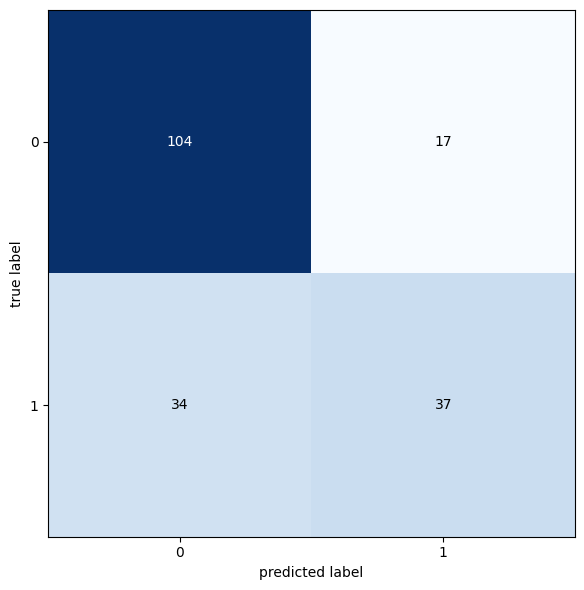

In [7]:
linear_svm.plot_confusion_matrix()

                    Feature    Importance
0               Pregnancies  1.393229e-02
1                   Glucose  1.281250e-01
2             BloodPressure  5.598958e-03
3             SkinThickness  1.822917e-03
4                   Insulin  1.110223e-17
5                       BMI  2.929688e-02
6  DiabetesPedigreeFunction  8.203125e-03
7                       Age -2.994792e-03


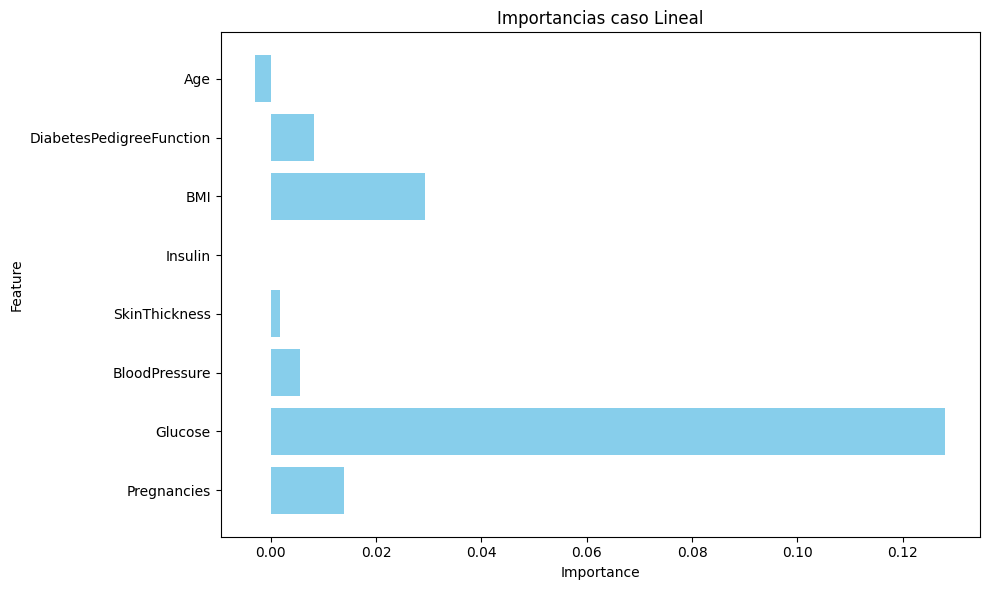

In [8]:
linear_svm.feature_importance()

In [9]:
# SVM Radial
radial_svm = RadialSVM(lectura_datos.df, target_variable="Outcome")
radial_svm.fit()
radial_svm.accuracy()

Variables independientes (X) e independiente (Y) extraídas. Variable objetivo: 'Outcome'
Datos divididos en conjuntos de entrenamiento y prueba.
Tamaño del conjunto de entrenamiento: 576
Tamaño del conjunto de prueba: 192
----------------------------------------
Mejores hiperparámetros encontrados (cv)
----------------------------------------
{'C': 20.6913808111479} : 0.7760416666666666 accuracy
La precisión del test es: 74.47916666666666%


0.7447916666666666

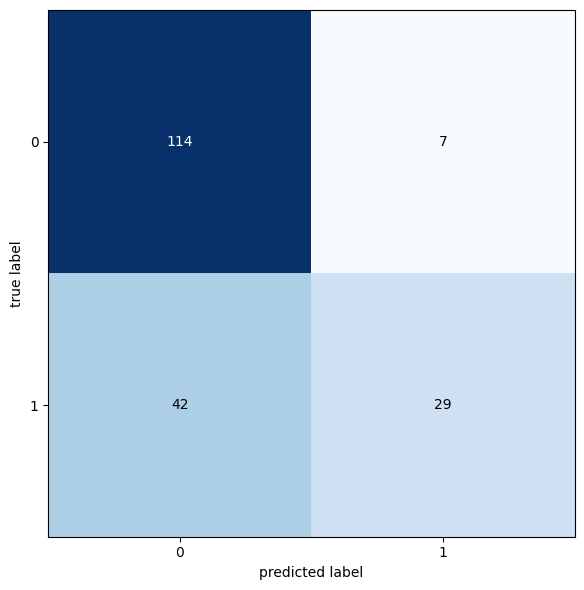

In [10]:
radial_svm.plot_confusion_matrix()

                    Feature  Importance
0               Pregnancies    0.004297
1                   Glucose    0.144010
2             BloodPressure    0.008464
3             SkinThickness    0.005729
4                   Insulin    0.021484
5                       BMI    0.025391
6  DiabetesPedigreeFunction   -0.001302
7                       Age    0.007552


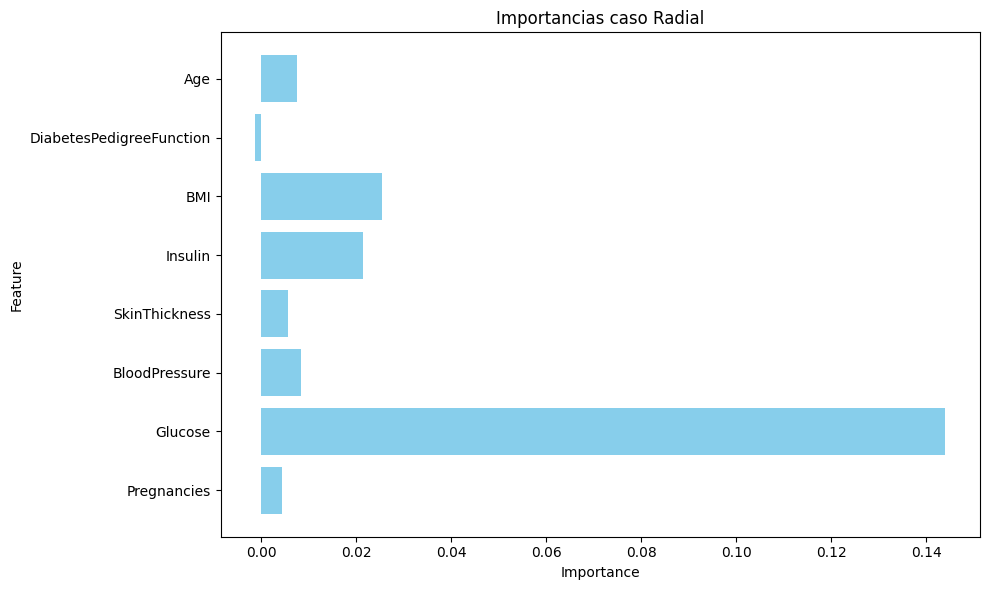

In [11]:
radial_svm.feature_importance()

In [12]:
# Arbol de decisión
arbol_de_decision = ArbolDeDecision(lectura_datos.df, target_variable="Outcome")
arbol_de_decision.fit()
arbol_de_decision.accuracy()

Variables independientes (X) e independiente (Y) extraídas. Variable objetivo: 'Outcome'
Datos divididos en conjuntos de entrenamiento y prueba.
Tamaño del conjunto de entrenamiento: 576
Tamaño del conjunto de prueba: 192
La precisión del test es: 69.27083333333334%


0.6927083333333334

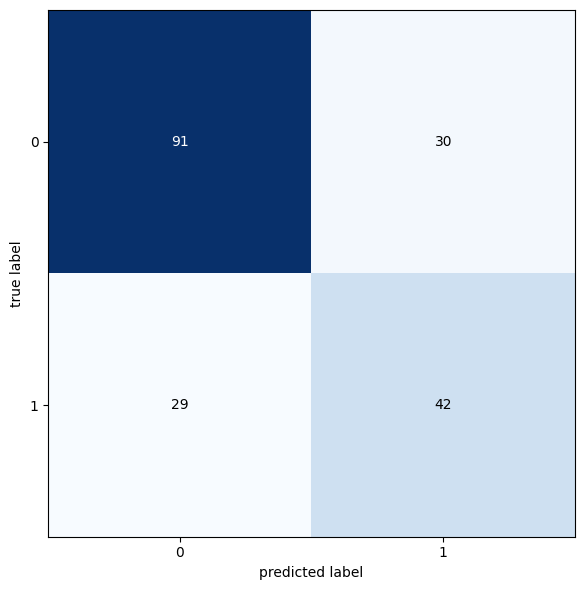

In [13]:
arbol_de_decision.plot_confusion_matrix()

                    Feature  Importance
0               Pregnancies    0.010417
1                   Glucose    0.049479
2             BloodPressure    0.006250
3             SkinThickness    0.012500
4                   Insulin   -0.010417
5                       BMI    0.036458
6  DiabetesPedigreeFunction    0.020313
7                       Age    0.017708


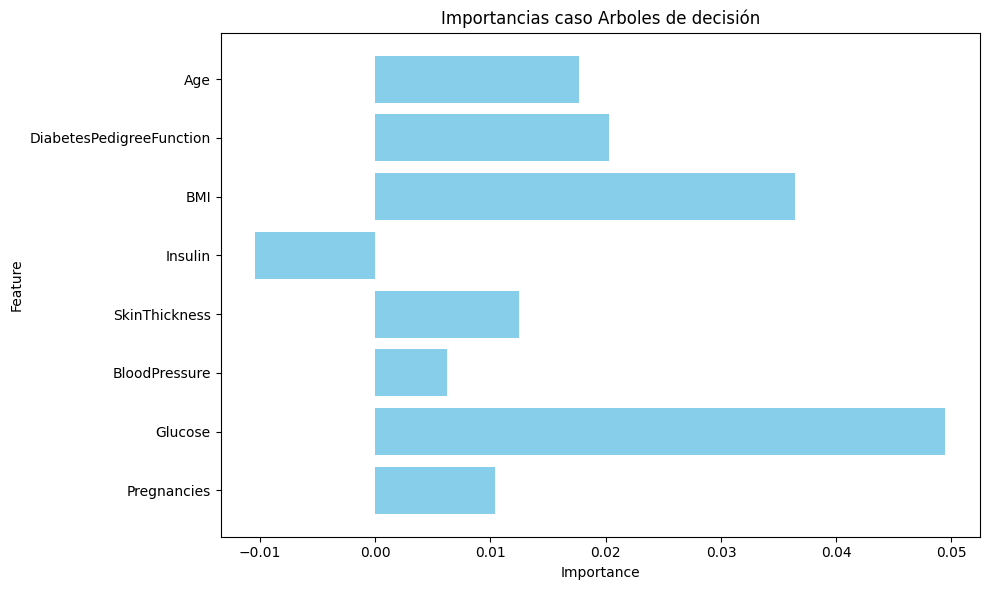

In [14]:
arbol_de_decision.feature_importance()

In [15]:
arbol_de_decision.plot_tree()